<h1 align="center">Problem 2 - Practical HBM</h1>
<h2 align="center">One- and Two-Component Gaussian Mixture Hierarchcial Bayesian Modeling with PyJAGS</h2>
<h3 align="center">Simulating the eccentricity distribution of hot Jupiter exoplanets from the Kepler Mission</h3> 
<h4 align="center">LSSTC DSFP Session 4, September 21st, 2017</h4>
<h5 align="center">Author: Megan I. Shabram, PhD, 
NASA Postdoctoral Program Fellow,  mshabram@gmail.com</h5>


1. Use the code below to explore a two-component Gaussian mixture model
2. Using the simulated data code cells below, evaluate the one-component truncated Gaussian generative model simualted data with the two-component Gaussian mixture HBM. What do you notice about the posteriors for the mixture fractions? 
3. Repeat this exersize but now evaluating simulated data from a one-component generative model with a two-component HBM. 
4. Notebook 3: Using the JAGS model code block for a break-point HBM, set up and evaluate the break-point HBM on the real Kepler eclipsing binary data set provided (some code is provided for analysis).  



In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pyjags
import pickle

from __future__ import division, print_function
from pandas.tools.plotting import *
from matplotlib import rcParams
rcParams["savefig.dpi"] = 100
rcParams["font.size"] = 20
#plt.style.use('ggplot')

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
#%qtconsole


<h3 align="left"> 1. Generate simulated data set: one- and two-component truncated Gaussian mixture generative models:</h3>


In [12]:
## function to draw from truncated normal, this function will be used for both the 
## one- and two-componenet cases in this workbook.  

def rnorm_bound( Ndata, mu, prec, lower_bound = 0.0, upper_bound = float('Inf')):
    x = np.zeros(Ndata)
    #print(x)
    for i in range(0, Ndata): 
            #print(i)
            while True:
                x[i] = np.random.normal(mu,prec,1)
                if( (x[i]>lower_bound) and (x[i]<upper_bound) ): 
                    break
    return x;

In [13]:
## Check the output to make sure the function is outputting as expected. 
#print(np.random.normal(0,0.0001,10))
print(rnorm_bound(10, 0.0, 0.001, lower_bound=-1,upper_bound=1))

[ -1.86935708e-04   1.82575629e-03  -5.96758006e-04  -3.87276890e-04
   5.43964827e-05   1.47959939e-03   6.22155045e-04   4.24869933e-04
   8.78488938e-04  -2.92405930e-05]


h: [-0.2443533   0.31433542 -0.19815804  0.24125766 -0.16181172 -0.09223227
  0.56450322  0.0629111  -0.16336834  0.23028201  0.28850746  0.33081531
 -0.56542992 -0.25403076  0.11615836 -0.08988808 -0.01875608 -0.08711336
 -0.0434319   0.16972835  0.21538059 -0.19893232  0.27995785  0.13808116
 -0.6010553 ] hhat: [-0.30143658  0.27954267 -0.16119806  0.21939561 -0.18643167 -0.09023493
  0.57381258 -0.00329887 -0.16462319  0.28445427  0.22351598  0.3129018
 -0.55056703 -0.21406755  0.08055503 -0.17346496  0.06903855 -0.13245298
 -0.04733328  0.2029681   0.13339675 -0.15038956  0.24625773  0.18310796
 -0.60002291] k: [  2.65642881e-02   2.59037798e-01   2.95245549e-01   3.39205819e-01
   2.16415484e-02  -3.43358735e-01  -4.94208559e-02  -1.11661047e-01
   3.48021302e-01  -7.24333775e-01  -1.11998539e-01  -6.20743366e-02
   3.27708463e-01  -3.94073403e-01  -3.44659398e-02  -3.76938710e-01
  -2.90937855e-02   2.28790512e-01  -2.99063375e-01   2.13256747e-01
  -4.11757954e-01   4.29237279e-

(array([ 2.,  0.,  1.,  7.,  2.,  3.,  4.,  5.,  0.,  1.]),
 array([-0.60002291, -0.48263936, -0.36525581, -0.24787226, -0.13048871,
        -0.01310516,  0.10427839,  0.22166194,  0.33904548,  0.45642903,
         0.57381258]),
 <a list of 10 Patch objects>)

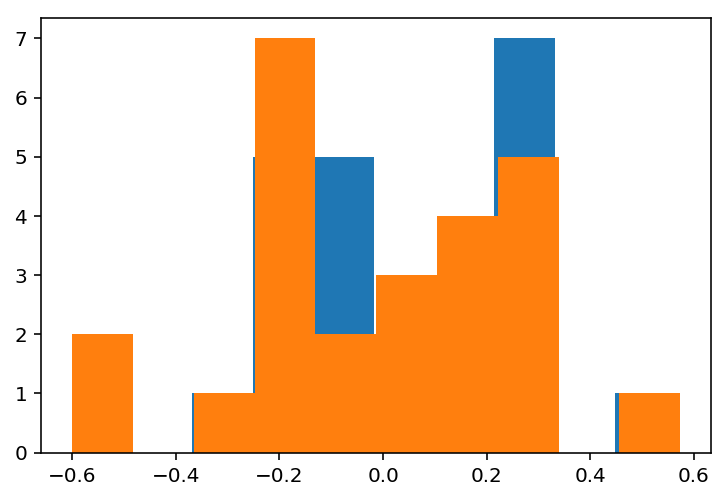

In [14]:
## One-component Gaussian Mixture Simulated Data for both projected eccentricity terms
## Below we designate the population values of our generative model. These are the 
## truths that we should recover if our hiararchical Bayesian model is properly specified 
## and diagnostics have indicated that the simulation has "not not converged". "You can't 
## prove convergence, at best you can fail to prove a failure to converge".

## In this simulated data set, their are 25 planetary systems (with one planet each)
Ndata = 25 
## Here we asign the dispersion of the simulated population to be 0.3, this is 
## the truth we wish to recovern 
sigmae = 0.3 
## We approximate the uncertainty for each measurement as normally distributed about a 
## reported measurement point estimate.  
## For the eccentricity distribution for Hot Jupiters, the physical models used to derive 
## these produce larger uncertainty in k by a factor of 2. 
sigmahobs = 0.04
sigmakobs = 0.08

h = np.repeat(0.,Ndata)
k = np.repeat(0.,Ndata)
hhat = np.repeat(0.,Ndata)
khat = np.repeat(0.,Ndata)
hhat_sigma  = np.repeat(sigmahobs,Ndata)
khat_sigma  = np.repeat(sigmakobs,Ndata)

#print(khat_sigma)


for i in range(0,Ndata):
    h[i] = rnorm_bound(1,0,sigmae,lower_bound=-1,upper_bound=1)
    lb = -np.sqrt(1-h[i]**2)
    ub = np.sqrt(1-h[i]**2)
    k[i] = rnorm_bound(1,0,sigmae,lower_bound=lb,upper_bound=ub) 
    hhat[i] = rnorm_bound(1,h[i],sigmahobs,lower_bound=-1,upper_bound=1)
    khat[i] = rnorm_bound(1,k[i],sigmakobs,lower_bound=lb,upper_bound=ub)

## Vizualize the true data values, and the simulated measurements:     
print('h:',h,'hhat:', hhat,'k:', k,'khat:', khat)
plt.hist(h)
plt.hist(hhat)

In [15]:
## JAGS user manual: 
## http://www.uvm.edu/~bbeckage/Teaching/DataAnalysis/Manuals/manual.jags.pdf

## JAGS model code

## model code is the one-component truncated gaussian mixture HBM code from previous 
## notebook


code1 = '''

model {
        
    #Population parameters
    e_sigma ~ dunif(0.0, 1.0)
    e_phi <- 1/(e_sigma*e_sigma)
        
    for (n in 1:Ndata){
    
        #True planet properties
        h[n] ~ dnorm(0, e_phi) T(-1,1) #Can try multivariate truncated normal in future
        k[n] ~ dnorm(0, e_phi) T(-sqrt(1-h[n]*h[n]),sqrt(1-h[n]*h[n]))
            
        #Observed planet properties
        hhat[n] ~ dnorm(h[n], 1.0/(hhat_sigma[n]*hhat_sigma[n])) T(-1,1)
        khat[n] ~ dnorm(k[n], 1.0/(khat_sigma[n]*khat_sigma[n])) T(-sqrt(1-hhat[n]*hhat[n]),sqrt(1-hhat[n]*hhat[n]))
    }
        
}
''' #the string is read in specially by this package

In [16]:
## Load additional JAGS module
pyjags.load_module('glm')
pyjags.load_module('dic')


## See blog post for origination of the adapted analysis tools used here and below:
## https://martynplummer.wordpress.com/2016/01/11/pyjags/

num_chains = 4
iterations = 10000


## data list include only variables in the model
model = pyjags.Model(code1, data=dict( Ndata=Ndata, hhat=hhat, khat=khat, 
                                     hhat_sigma=hhat_sigma, khat_sigma=khat_sigma), 
                     chains=num_chains, adapt=1000)

## Code to speed up compute time. This feature might not be 
## well tested in pyjags at this time. 
## threads=4, chains_per_thread=1 

## 500 warmup / burn-in iterations, not used for inference.
model.sample(500, vars=[])

## Run model for desired steps, monitoring hyperparameter variables, and latent variables
## for hierarchical Bayesian model.
## Returns a dictionary with numpy array for each monitored variable.
## Shapes of returned arrays are (... shape of variable ..., iterations, chains).
## samples = model.sample(#iterations per chain here, vars=['e_sigma', 'h', 'k'])
samples = model.sample(iterations, vars=['e_sigma', 'h', 'k'])

## Code to save, open and use pickled dictionary of samples:
## -- Pickle the data --
#with open('ecc_1_test.pkl', 'wb') as handle:
#   pickle.dump(samples, handle)
## -- Retrieve pickled data --
#with open('ecc_1_test.pkl', 'rb') as handle:
#   retrieved_results = pickle.load(handle)


adapting: iterations 4000 of 4000, elapsed 0:00:01, remaining 0:00:00
sampling: iterations 2000 of 2000, elapsed 0:00:01, remaining 0:00:00
sampling: iterations 19868 of 40000, elapsed 0:00:06, remaining 0:00:06
sampling: iterations 37012 of 40000, elapsed 0:00:11, remaining 0:00:01
sampling: iterations 40000 of 40000, elapsed 0:00:12, remaining 0:00:00


In [18]:
## Generalize code for both h and k below. 

#print(samples)
#print(samples.items())

## Print and check the shape of the resultant samples dictionary:
print(samples['e_sigma'].shape)
print(samples['e_sigma'].squeeze(0).shape)
print(samples['h'].shape)
print(samples['k'][0,:,:].shape)
print('-----')


## Update the samples dictionary so that it includes keys for the latent variables
## Also, we will use LaTeX formatting to help make legible plots ahead.  
samples_Nm1 = {}

## adjust the thin varible to only look at every 10th population element by setting it to 10
thin = 1
## Need to enter the number of hyperparameter variables here:
numHyperParams = 1
## Specify the dimension we want for our plot below, for legibility.  
dim = (Ndata/thin)*2 + numHyperParams
print(dim)

for i in np.arange(0,Ndata,thin):
    #hval = 'h'+str(i+1)
    #kval = 'k'+str(i+1)
    #print(hval)
    #print(kval)
    #samples_Nm1({hval: samples['h'][i,:,:]})
    samples_Nm1.update({'$h_{'+str(i+1)+'}$': samples['h'][i,:,:], '$k_{'+str(i+1)+'}$': samples['k'][i,:,:]})
#print(samples_2['h11'].shape)

## Add the hyperparameter marginal posterior back in:
samples_Nm1.update({'$e_{\sigma}$': samples['e_sigma'].squeeze(0)})

## Below, examine the updated and reformatted sample dictionary to include keys for 
## latent variables 
for j, i in samples_Nm1.items():
    print(j)
    print(i)
samples_Nm1['$h_{5}$'][0]

(1, 10000, 4)
(10000, 4)
(25, 10000, 4)
(10000, 4)
-----
51.0
$h_{2}$
[[ 0.2906152   0.293624    0.35381064  0.32117005]
 [ 0.28201713  0.3274544   0.35027293  0.29937317]
 [ 0.29457257  0.32933897  0.37231592  0.32091205]
 ..., 
 [ 0.20694117  0.24505841  0.25092603  0.25782246]
 [ 0.30408632  0.30325615  0.25756406  0.30797266]
 [ 0.24714519  0.26333564  0.23398716  0.30125426]]
$k_{6}$
[[-0.44543321 -0.37913688 -0.44071595 -0.30086299]
 [-0.445768   -0.2996826  -0.51557422 -0.46062217]
 [-0.39117439 -0.37815998 -0.48974643 -0.33158287]
 ..., 
 [-0.45746029 -0.39023323 -0.25384499 -0.44311395]
 [-0.43297231 -0.33450399 -0.28509335 -0.35114525]
 [-0.44155175 -0.43264989 -0.39222245 -0.37941083]]
$k_{17}$
[[ 0.032914    0.09583595  0.02869948  0.03258392]
 [ 0.0572072  -0.09404398  0.07050495 -0.00795873]
 [-0.02223998 -0.00905344  0.01896586  0.05042794]
 ..., 
 [-0.0616652   0.11657902  0.03581896  0.08212451]
 [-0.00740702  0.00735315  0.08901984  0.03493334]
 [ 0.16185189  0.040207

array([-0.19662354, -0.17680897, -0.17269381, -0.1636558 ])

<div>  <p>Below is code to look at <b>summary statistics</b> of <b>the marginal posterior distributions</b>  (the probabilistic parameter estimates) 
for the hyperparameter and the latent variables 
(each population constituent), in this case <i>h</i> and <i>k</i> (a.k.a projected eccentricity here), of the exoplanet systems we are simulating). </p> </div>

In [19]:
## equal tailed 95% credible intervals, and posterior distribution means:
def summary(samples, varname, p=95):
    values = samples[varname][0]
    ci = np.percentile(values, [100-p, p])
    print('{:<6} mean = {:>5.1f}, {}% credible interval [{:>4.1f} {:>4.1f}]'.format(
      varname, np.mean(values), p, *ci))

for varname in samples_Nm1:
    summary(samples_Nm1, varname)


$h_{2}$ mean =   0.3, 95% credible interval [ 0.3  0.3]
$k_{6}$ mean =  -0.4, 95% credible interval [-0.4 -0.3]
$k_{17}$ mean =   0.0, 95% credible interval [ 0.0  0.1]
$h_{3}$ mean =  -0.2, 95% credible interval [-0.2 -0.1]
$h_{14}$ mean =  -0.2, 95% credible interval [-0.3 -0.2]
$k_{16}$ mean =  -0.4, 95% credible interval [-0.4 -0.3]
$k_{14}$ mean =  -0.2, 95% credible interval [-0.2 -0.2]
$h_{15}$ mean =   0.1, 95% credible interval [ 0.0  0.1]
$h_{17}$ mean =   0.1, 95% credible interval [ 0.1  0.1]
$h_{5}$ mean =  -0.2, 95% credible interval [-0.2 -0.2]
$k_{24}$ mean =  -0.0, 95% credible interval [-0.1  0.1]
$h_{18}$ mean =  -0.2, 95% credible interval [-0.2 -0.1]
$h_{19}$ mean =  -0.0, 95% credible interval [-0.1  0.0]
$k_{11}$ mean =  -0.1, 95% credible interval [-0.2 -0.1]
$e_{\sigma}$ mean =   0.3, 95% credible interval [ 0.3  0.4]
$k_{22}$ mean =   0.5, 95% credible interval [ 0.4  0.5]
$k_{7}$ mean =  -0.2, 95% credible interval [-0.2 -0.1]
$k_{9}$ mean =   0.4, 95% credib

Variable
$e_{\sigma}$    0.290010
$h_{10}$        0.278963
$h_{11}$        0.219657
$h_{12}$        0.306905
$h_{13}$       -0.540060
$h_{14}$       -0.210189
$h_{15}$        0.078734
$h_{16}$       -0.169809
$h_{17}$        0.067882
$h_{18}$       -0.129705
$h_{19}$       -0.046625
$h_{1}$        -0.295483
$h_{20}$        0.199233
$h_{21}$        0.130658
$h_{22}$       -0.147349
$h_{23}$        0.241394
$h_{24}$        0.179422
$h_{25}$       -0.588105
$h_{2}$         0.273923
$h_{3}$        -0.158143
$h_{4}$         0.215206
$h_{5}$        -0.183406
$h_{6}$        -0.088389
$h_{7}$         0.562799
$h_{8}$        -0.003235
$h_{9}$        -0.161450
$k_{10}$       -0.685859
$k_{11}$       -0.106721
$k_{12}$       -0.075290
$k_{13}$        0.261943
$k_{14}$       -0.235044
$k_{15}$        0.015092
$k_{16}$       -0.373747
$k_{17}$        0.024308
$k_{18}$        0.222263
$k_{19}$       -0.261118
$k_{1}$         0.057317
$k_{20}$        0.224835
$k_{21}$       -0.427310
$k_{22}$        

/anaconda/envs/dsfp_py27/lib/python2.7/site-packages/ipykernel_launcher.py:27: FutureWarning: 'pandas.tools.plotting.autocorrelation_plot' is deprecated, import 'pandas.plotting.autocorrelation_plot' instead.


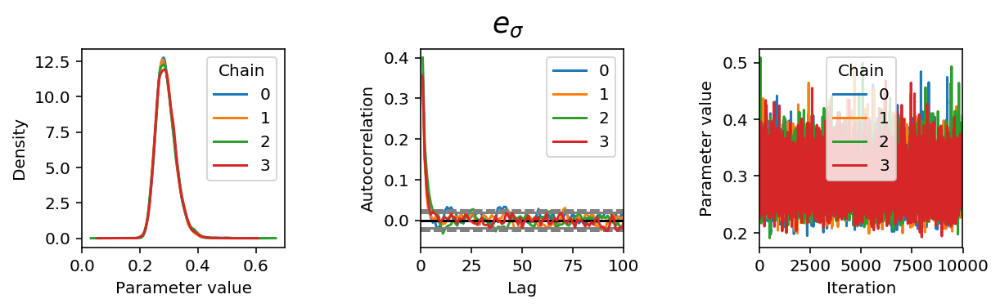

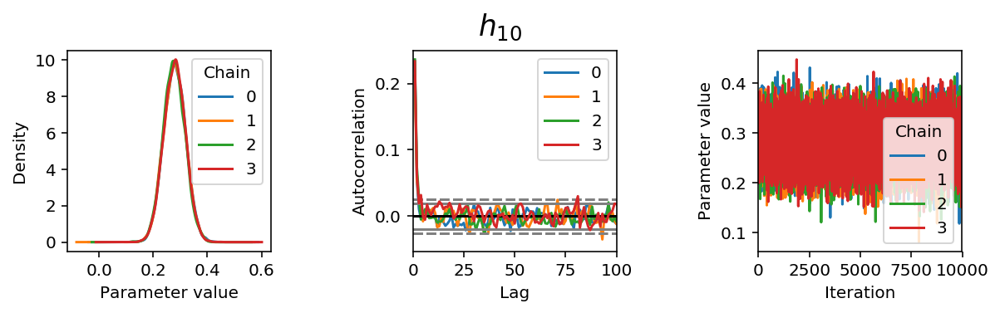

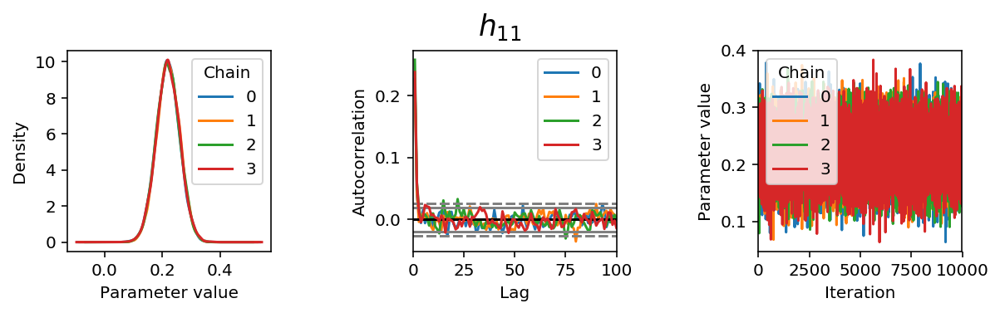

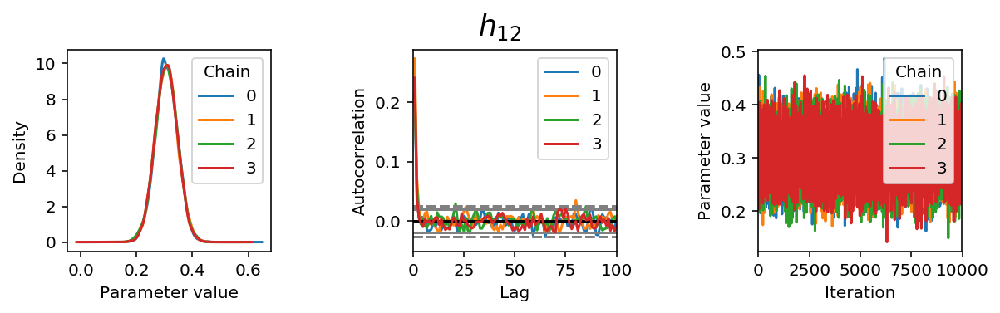

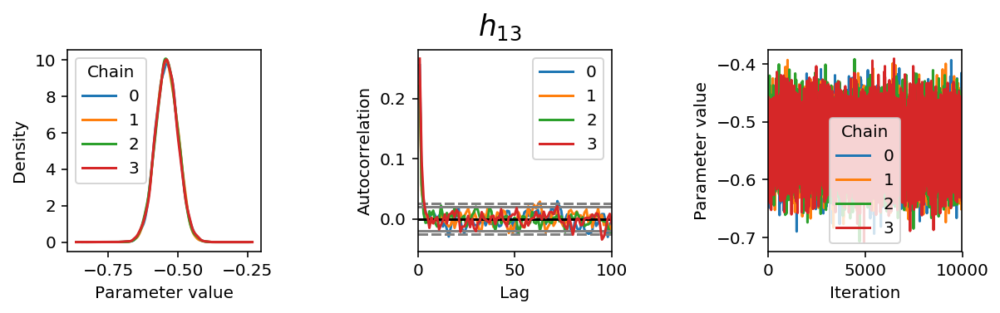

...

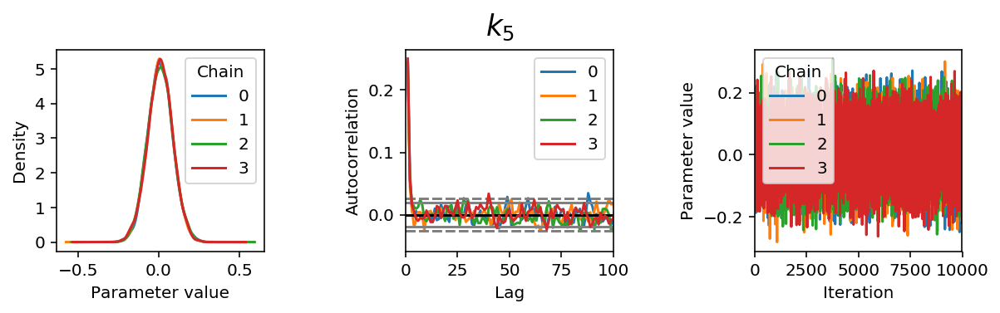

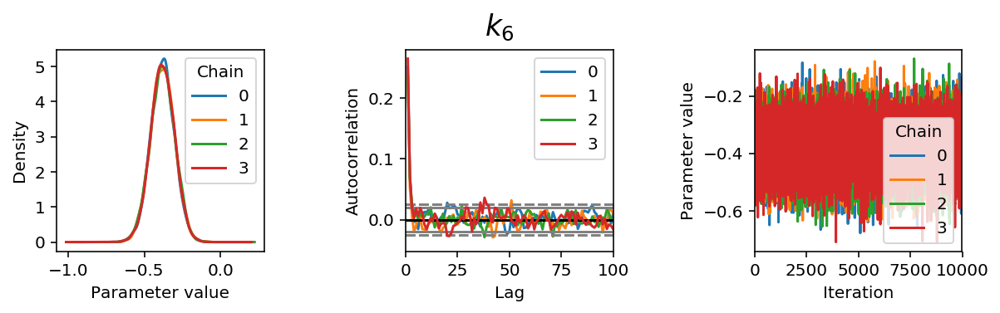

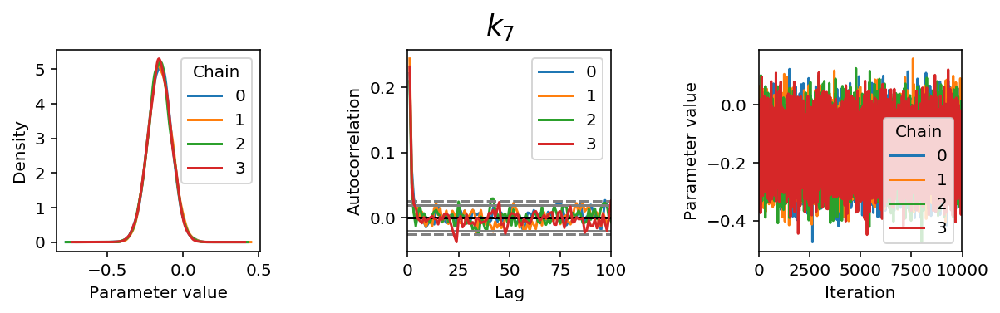

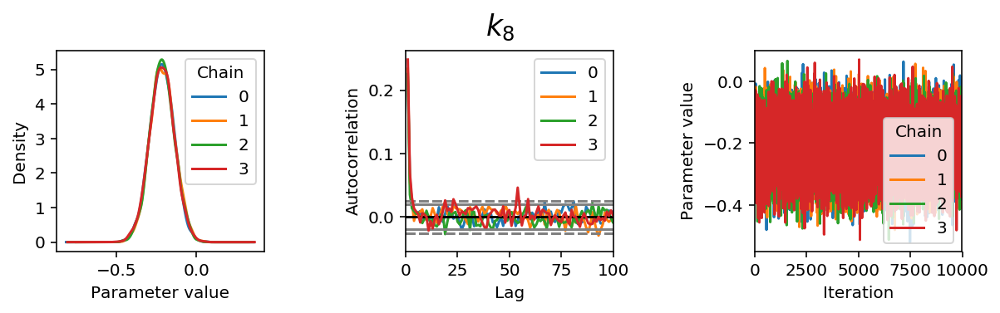

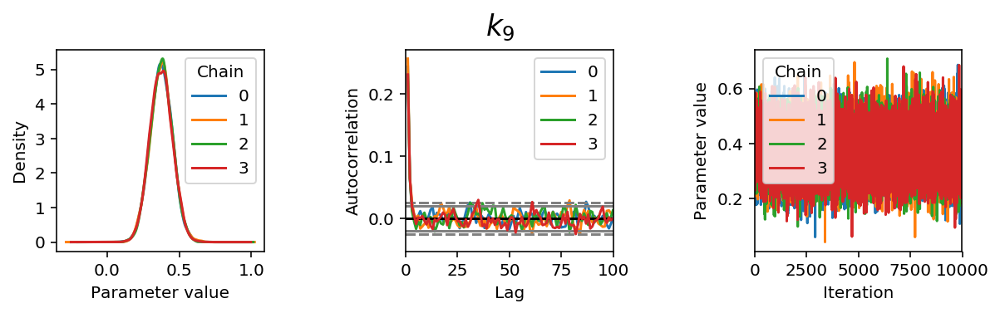

In [20]:
## Use pandas three dimensional Panel to represent the trace:

trace = pd.Panel({k: v for k, v in samples_Nm1.items()})
trace.axes[0].name = 'Variable'
trace.axes[1].name = 'Iteration'
trace.axes[2].name = 'Chain'
 
## Point estimates:
print(trace.to_frame().mean())
 
## Bayesian equal-tailed 95% credible intervals:
print(trace.to_frame().quantile([0.05, 0.95]))
  ## ^ entering the values here could be a good question part
    
def plot(trace, var):
    fig, axes = plt.subplots(1, 3, figsize=(9, 3))
    fig.suptitle(var, y=0.95, fontsize='xx-large')
 
    ## Marginal posterior density estimate:
    trace[var].plot.density(ax=axes[0])
    axes[0].set_xlabel('Parameter value')
    axes[0].locator_params(tight=True)
 
    ## Autocorrelation for each chain:
    axes[1].set_xlim(0, 100)
    for chain in trace[var].columns:
        autocorrelation_plot(trace[var,:,chain], axes[1], label=chain)
 
    ## Trace plot:
    axes[2].set_ylabel('Parameter value')
    trace[var].plot(ax=axes[2])
 
    ## Save figure
    filename = var.replace("\\", "") 
    filename = filename.replace("$", "") 
    filename = filename.replace("}", "") 
    filename = filename.replace("{", "") 
    plt.tight_layout(pad=3)
    fig.savefig('Nm1_JAGS_h_and_k_'+'{}.png'.format(filename))
 
# Display diagnostic plots
for var in trace:
    plot(trace, var)
 


6.0
$k_{21}$
$h_{21}$
$k_{1}$
$k_{11}$
$e_{\sigma}$
$h_{1}$
$h_{11}$


/anaconda/envs/dsfp_py27/lib/python2.7/site-packages/ipykernel_launcher.py:25: FutureWarning: 'pandas.tools.plotting.scatter_matrix' is deprecated, import 'pandas.plotting.scatter_matrix' instead.


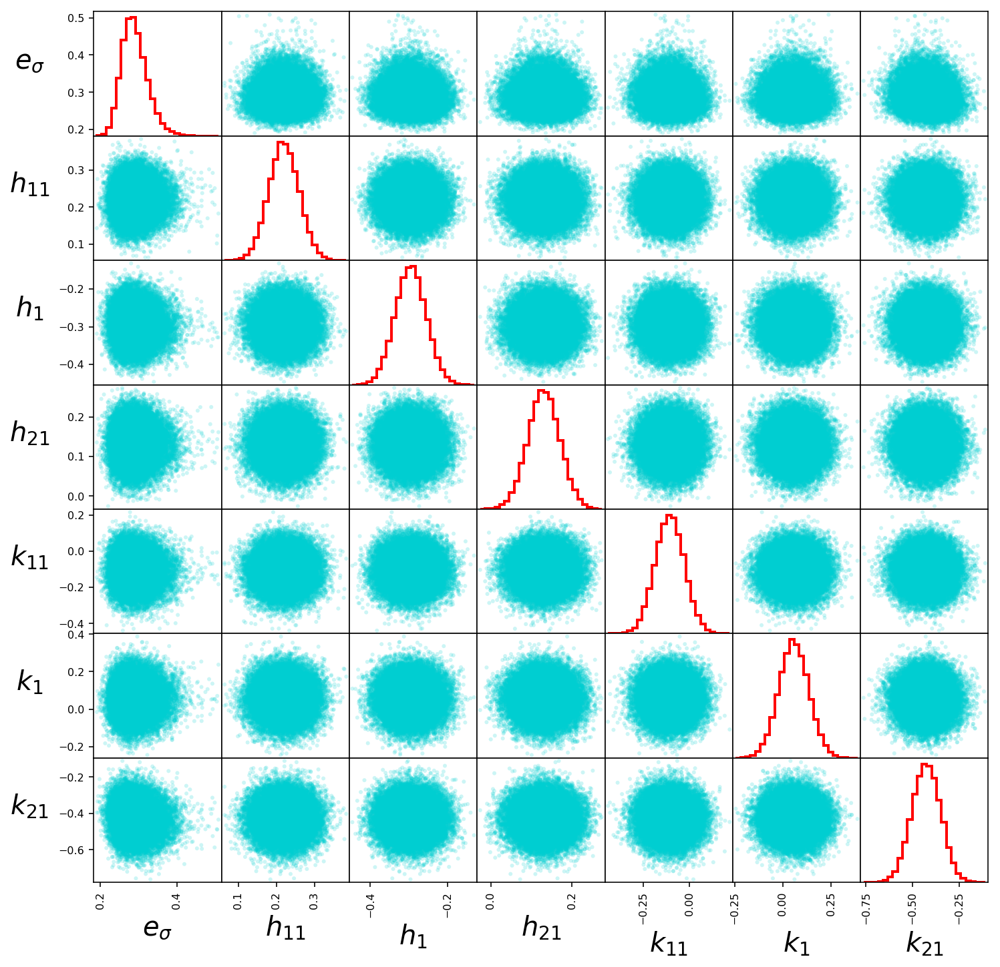

In [21]:
## Scatter matrix plot:

## Redefine the trace so that we only vizualize every 10th latent variable element in 
## the scatter_matrix plot below. Vizualizing all 50 is too cumbersome for the scatter
## matrix. 

samples_Nm1_for_scatter_matrix = {}
Nsamp=25
## adjust the thin varible to only look at every 10th population element by setting it to 10
thin = 10
numHyperParams = 1
dim = (Nsamp/thin)*2 + numHyperParams
print(dim)

for i in np.arange(0,Nsamp,thin):
    samples_Nm1_for_scatter_matrix.update({'$h_{'+str(i+1)+'}$': samples['h'][i,:,:], '$k_{'+str(i+1)+'}$': samples['k'][i,:,:]})
samples_Nm1_for_scatter_matrix.update({'$e_{\sigma}$': samples['e_sigma'].squeeze(0)})

for j, i in samples_Nm1_for_scatter_matrix.items():
    print(j)
#    print(i)

trace_2 = pd.Panel({k: v for k, v in samples_Nm1_for_scatter_matrix.items()})

sm = scatter_matrix(trace_2.to_frame(),  color="darkturquoise", alpha=0.2, figsize=(dim*2, dim*2), diagonal='hist',hist_kwds={'bins':25,'histtype':'step', 'edgecolor':'r','linewidth':2})
## y labels size
[plt.setp(item.yaxis.get_label(), 'size', 20) for item in sm.ravel()]
## x labels size 
[plt.setp(item.xaxis.get_label(), 'size', 20) for item in sm.ravel()]
## Change label rotation
## This is helpful for very long labels
#[s.xaxis.label.set_rotation(45) for s in sm.reshape(-1)]
[s.xaxis.label.set_rotation(0) for s in sm.reshape(-1)]
[s.yaxis.label.set_rotation(0) for s in sm.reshape(-1)]
## May need to offset label when rotating to prevent overlap of figure
[s.get_yaxis().set_label_coords(-0.5,0.5) for s in sm.reshape(-1)]
## Hide all ticks
#[s.set_xticks(()) for s in sm.reshape(-1)]
#[s.set_yticks(()) for s in sm.reshape(-1)]

plt.savefig('scatter_matrix_Nm1_JAGS.png')


<h3 align="left"> 2. Generalize to a two-component Gaussian Mixture Population Model </h3>

In [25]:
## Below we designate the population values of our two-component truncated Gaussian 
## generative model. These are the truths that we should recover if our hiararchical 
## Bayesian model is properly specified and diagnostics have indicated that the simulation 
## has "not not converged".
Ndata = 25  # originally 50, but takes too long
Nm = 2
frac = [0.7,0.3]
sigmae = [0.05,0.3]

## After generating values from the population model, we now add realistic Gaussian noise 
## to create simulated measurements. 
sigmahobs = 0.04
sigmakobs = 0.08

h = np.repeat(0.,Ndata)
k = np.repeat(0.,Ndata)
hhat = np.repeat(0.,Ndata)
khat = np.repeat(0.,Ndata)
hhat_sigma  = np.repeat(sigmahobs,Ndata)
khat_sigma  = np.repeat(sigmakobs,Ndata)

#print(khat_sigma)

for i in range(0,Ndata):
    #print('i')
    #print(i)
    
    c = np.random.choice(len(frac), 1, p=frac, replace=True)
    #print(int(c))
    h[i] = rnorm_bound(1,0,sigmae[int(c)],lower_bound=-1,upper_bound=1)
    # Euler's formula: h^2 + k^2 = 1
    lb = -np.sqrt(1-h[i]**2)
    ub = np.sqrt(1-h[i]**2)
    k[i] = rnorm_bound(1,0,sigmae[int(c)],lower_bound=lb,upper_bound=ub) 
    hhat[i] = rnorm_bound(1,h[i],sigmahobs,lower_bound=-1,upper_bound=1)
    khat[i] = rnorm_bound(1,k[i],sigmakobs,lower_bound=lb,upper_bound=ub)

    
print(h, hhat, k, khat)

[-0.03482649  0.02421113  0.12249059 -0.0624369   0.02100027 -0.00289996
  0.14680993  0.02417903  0.024896   -0.08968328 -0.01905709 -0.3596107
 -0.08016359 -0.26808068 -0.61300252 -0.02089394  0.36386275 -0.0664412
  0.05252881  0.03985404 -0.03341094  0.02541961 -0.06272586 -0.05684986
 -0.17103549] [ -1.51595514e-02   5.91287335e-03   1.63809523e-01  -7.39697496e-02
   5.29454897e-02  -6.57731471e-02   1.24375385e-01   1.14827450e-02
   3.21943335e-02  -1.87100315e-01  -2.37756835e-02  -3.66857382e-01
  -1.20448869e-01  -2.70894663e-01  -5.72466996e-01   8.01697716e-03
   4.36688777e-01  -3.69326229e-02   3.17711987e-04  -1.61481533e-02
  -6.08881115e-02   2.18701242e-02  -7.38075674e-02  -5.95268770e-02
  -2.54051658e-01] [ 0.01476883 -0.06578807  0.03667914 -0.02928253 -0.31595207  0.0812268
 -0.0895457   0.00495008 -0.0929216   0.001452   -0.07275798 -0.05572185
 -0.19410706  0.21610359 -0.10618628  0.10694989 -0.12705548 -0.05610673
  0.02327477  0.05131534 -0.00173314 -0.08154

In [26]:
# JAGS model code

code = '''

model {
        
    #Population parameters
    for (j in 1:Nm) {
        e_sigma[j] ~ dunif(0.0, 1.0)
        e_phi[j] <- 1/(e_sigma[j]*e_sigma[j])
        a[j] <- 1;
    }

    f ~ ddirch(a[])
        
    for (n in 1:Ndata){
    
        #True planet properties
        c[n] ~ dcat(f[]) 
        h[n] ~ dnorm(0, e_phi[c[n]]) T(-1,1) #Can try multivariate truncated normal in future
        k[n] ~ dnorm(0, e_phi[c[n]]) T(-sqrt(1-h[n]*h[n]),sqrt(1-h[n]*h[n]))
            
        #Observed planet properties
        hhat[n] ~ dnorm(h[n], 1.0/(hhat_sigma[n]*hhat_sigma[n])) T(-1,1)
        khat[n] ~ dnorm(k[n], 1.0/(khat_sigma[n]*khat_sigma[n])) T(-sqrt(1-hhat[n]*hhat[n]),sqrt(1-hhat[n]*hhat[n]))
    }
        
}
'''

In [28]:
# Load additional JAGS module
pyjags.load_module('glm')
pyjags.load_module('dic')

#data list include only variables in the model
model = pyjags.Model(code, data=dict(Nm=Nm, Ndata=Ndata, hhat=hhat, khat=khat, 
                                     hhat_sigma=hhat_sigma, khat_sigma=khat_sigma), 
                     chains=4, adapt=1000)
# threads=4, chains_per_thread=1 
# 500 warmup / burn-in iterations, not used for inference.
model.sample(500, vars=[])

## Run model for desired steps, monitoring hyperparameter variables.
## Returns a dictionary with numpy array for each monitored variable.
## Shapes of returned arrays are (... shape of variable ..., iterations, chains).
## 
iters = 10000 # origionally 1000000
samples2 = model.sample(iters, vars=['e_sigma', 'h', 'k', 'c', 'f'])

# Pickle the data
#with open('ecc_1_test.pkl', 'wb') as handle:
#    pickle.dump(samples, handle)
    
# Retrieve pickled data
# with open('ecc_1_test.pkl', 'rb') as handle:
#      retrieved_results = pickle.load(handle)


adapting: iterations 4000 of 4000, elapsed 0:00:02, remaining 0:00:00
sampling: iterations 2000 of 2000, elapsed 0:00:01, remaining 0:00:00
sampling: iterations 22060 of 40000, elapsed 0:00:10, remaining 0:00:08
sampling: iterations 33528 of 40000, elapsed 0:00:15, remaining 0:00:03
sampling: iterations 40000 of 40000, elapsed 0:00:17, remaining 0:00:00


Sort the high and low mixture components to accomidate the exchangeability of parameters

0.00481565693843


([array([   1.,    5.,   25.,   67.,  106.,  182.,  195.,  232.,  152.,   35.]),
  array([   6.,   28.,   99.,  187.,  229.,  175.,  124.,  102.,   42.,    8.]),
  array([   1.,   11.,   50.,   74.,  162.,  176.,  200.,  180.,  116.,   30.]),
  array([   1.,   24.,   67.,  126.,  180.,  182.,  197.,  161.,   59.,    3.])],
 array([ 0.01912167,  0.11672793,  0.2143342 ,  0.31194047,  0.40954674,
         0.50715301,  0.60475927,  0.70236554,  0.79997181,  0.89757808,
         0.99518434]),
 <a list of 4 Lists of Patches objects>)

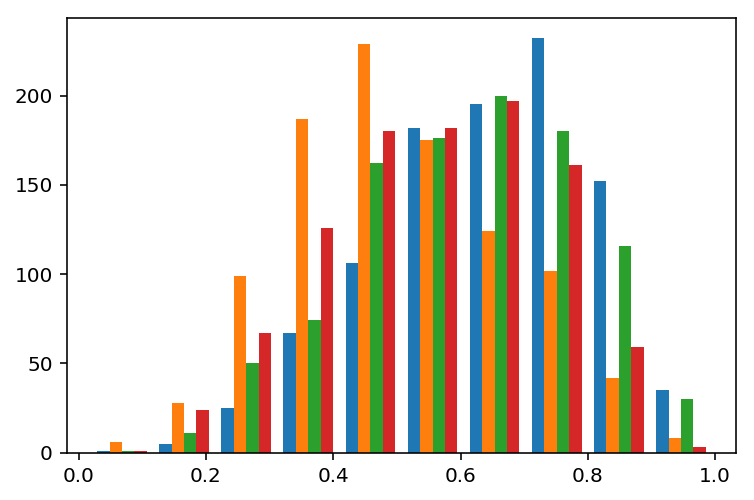

In [29]:
chain_thin = 100
start = int(iters-1000)
esigma_low = np.where(samples2['e_sigma'][0,start::,:] <= samples2['e_sigma'][1,start::,:], samples2['e_sigma'][0,start::,:], samples2['e_sigma'][1,start::,:])
esigma_hi = np.where(samples2['e_sigma'][0,start::,:] > samples2['e_sigma'][1,start::,:], samples2['e_sigma'][0,start::,:], samples2['e_sigma'][1,start::,:])
f_low = np.where(samples2['e_sigma'][0,start::,:] <= samples2['e_sigma'][1,start::,:], samples2['f'][0,start::,:], samples2['f'][1,start::,:])
f_hi = np.where(samples2['e_sigma'][0,start::,:] > samples2['e_sigma'][1,start::,:], samples2['f'][0,start::,:], samples2['f'][1,start::,:])
print(np.min(f_hi))
plt.hist(f_low)

In [31]:
iters = 1000000

#print(samples)
#print(samples.items())

print(samples2['h'].shape)
print(samples2['k'][0,start::,:].shape)
print('-----')
samples_Nm2 = {}
Nsamp=25 #50
thin = 1
numHyperParams = 4
dim = (Nsamp/thin)*2 + numHyperParams
print(dim)
for i in np.arange(0,Nsamp,thin):
    samples_Nm2.update({'$h_{'+str(i+1)+'}$': samples2['h'][i,start::,:], '$k_{'+str(i+1)+'}$': samples2['k'][i,start::,:]})
samples_Nm2.update({'$e_{\sigma_{low}}$': esigma_low, '$e_{\sigma_{high}}$': esigma_hi })
samples_Nm2.update({'$f_{low}$': f_low,'$f_{high}$': f_hi })

for j, i in samples_Nm2.items():
    print(j)
    #print(i)


(25, 10000, 4)
(1000, 4)
-----
54.0
$h_{2}$
$k_{6}$
$k_{17}$
$h_{3}$
$h_{14}$
$k_{16}$
$k_{14}$
$h_{15}$
$h_{17}$
$h_{5}$
$k_{24}$
$f_{low}$
$h_{18}$
$h_{19}$
$k_{11}$
$k_{22}$
$k_{7}$
$k_{9}$
$k_{23}$
$h_{16}$
$h_{24}$
$k_{4}$
$h_{10}$
$h_{1}$
$h_{11}$
$k_{20}$
$f_{high}$
$k_{5}$
$k_{15}$
$k_{18}$
$k_{21}$
$h_{21}$
$k_{8}$
$h_{12}$
$e_{\sigma_{low}}$
$h_{20}$
$h_{22}$
$k_{19}$
$h_{13}$
$h_{9}$
$k_{1}$
$k_{3}$
$k_{2}$
$h_{4}$
$k_{12}$
$h_{6}$
$k_{10}$
$h_{7}$
$e_{\sigma_{high}}$
$h_{25}$
$h_{8}$
$h_{23}$
$k_{25}$
$k_{13}$


In [32]:
## equal tailed 95% credible intervals, and posterior distribution means:
def summary(samples, varname, p=95):
    values = samples[varname][0]
    ci = np.percentile(values, [100-p, p])
    print('{:<6} mean = {:>5.1f}, {}% credible interval [{:>4.1f} {:>4.1f}]'.format(
      varname, np.mean(values), p, *ci))

for varname in samples_Nm2:
    summary(samples_Nm2, varname)


$h_{2}$ mean =   0.0, 95% credible interval [-0.0  0.1]
$k_{6}$ mean =  -0.0, 95% credible interval [-0.1  0.0]
$k_{17}$ mean =  -0.3, 95% credible interval [-0.4 -0.2]
$h_{3}$ mean =   0.2, 95% credible interval [ 0.1  0.2]
$h_{14}$ mean =  -0.3, 95% credible interval [-0.3 -0.3]
$k_{16}$ mean =   0.2, 95% credible interval [ 0.1  0.3]
$k_{14}$ mean =   0.3, 95% credible interval [ 0.2  0.4]
$h_{15}$ mean =  -0.6, 95% credible interval [-0.6 -0.6]
$h_{17}$ mean =   0.4, 95% credible interval [ 0.4  0.5]
$h_{5}$ mean =   0.1, 95% credible interval [ 0.0  0.1]
$k_{24}$ mean =  -0.1, 95% credible interval [-0.1 -0.1]
$f_{low}$ mean =   0.6, 95% credible interval [ 0.4  0.8]
$h_{18}$ mean =  -0.0, 95% credible interval [-0.0  0.0]
$h_{19}$ mean =   0.0, 95% credible interval [-0.0  0.0]
$k_{11}$ mean =  -0.1, 95% credible interval [-0.2 -0.0]
$k_{22}$ mean =  -0.1, 95% credible interval [-0.2 -0.1]
$k_{7}$ mean =  -0.1, 95% credible interval [-0.2 -0.0]
$k_{9}$ mean =  -0.0, 95% credible 

Variable
$e_{\sigma_{high}}$    0.318459
$e_{\sigma_{low}}$     0.061644
$f_{high}$             0.422699
$f_{low}$              0.577301
$h_{10}$              -0.167687
$h_{11}$              -0.014887
$h_{12}$              -0.356429
$h_{13}$              -0.102654
$h_{14}$              -0.263578
$h_{15}$              -0.561645
$h_{16}$               0.007257
$h_{17}$               0.426661
$h_{18}$              -0.023931
$h_{19}$              -0.000225
$h_{1}$               -0.009139
$h_{20}$              -0.010137
$h_{21}$              -0.040191
$h_{22}$               0.017743
$h_{23}$              -0.059039
$h_{24}$              -0.040740
$h_{25}$              -0.246534
$h_{2}$                0.002816
$h_{3}$                0.147432
$h_{4}$               -0.047642
$h_{5}$                0.050039
$h_{6}$               -0.044629
$h_{7}$                0.104482
$h_{8}$                0.007191
$h_{9}$                0.023947
$k_{10}$               0.013255
$k_{11}$              -0.060811

/anaconda/envs/dsfp_py27/lib/python2.7/site-packages/ipykernel_launcher.py:27: FutureWarning: 'pandas.tools.plotting.autocorrelation_plot' is deprecated, import 'pandas.plotting.autocorrelation_plot' instead.


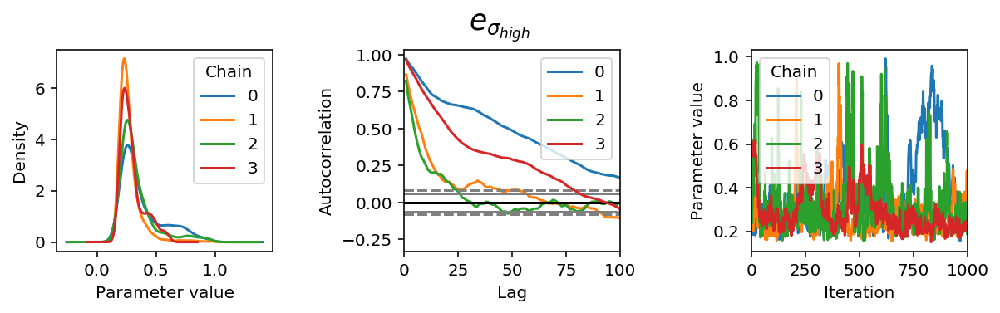

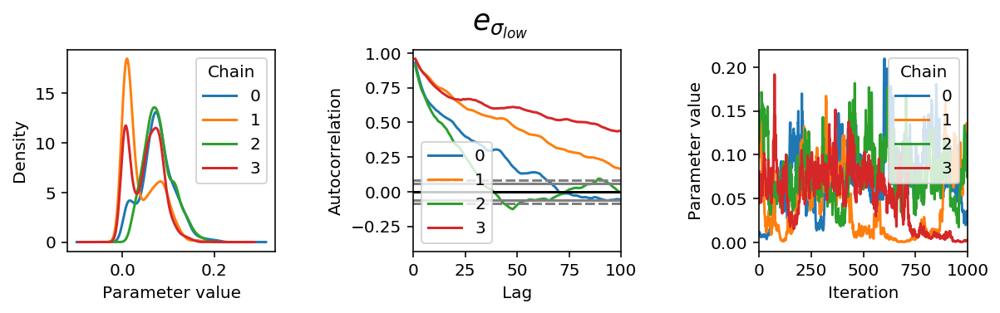

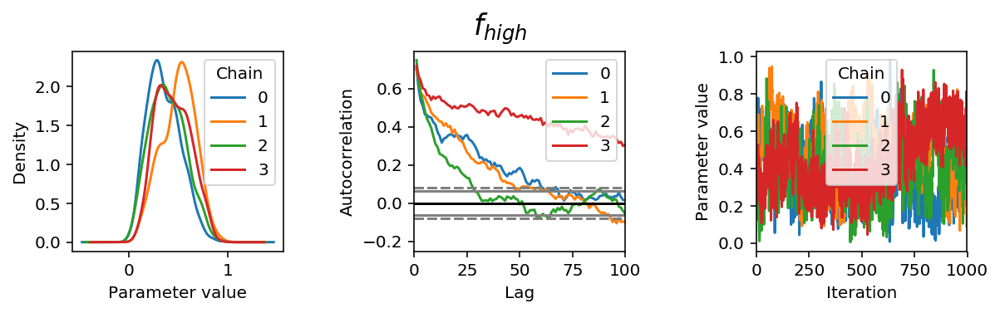

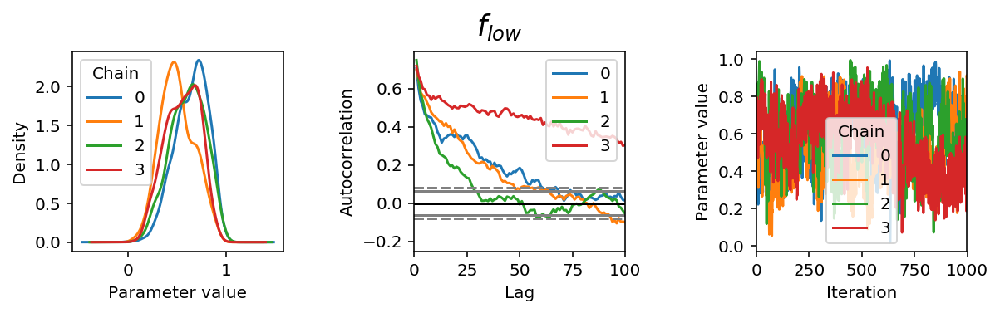

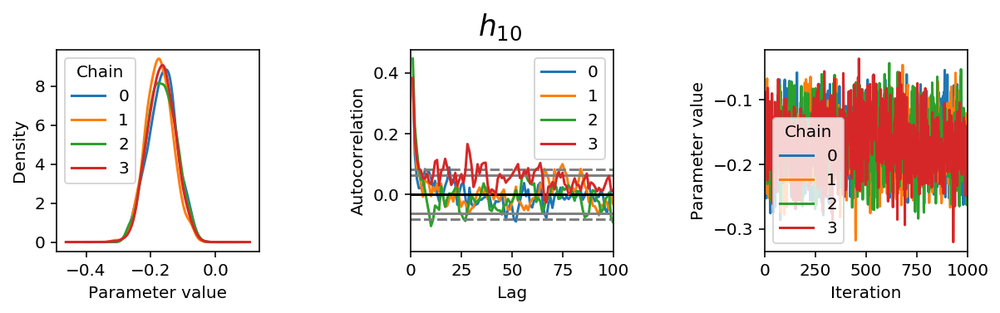

...

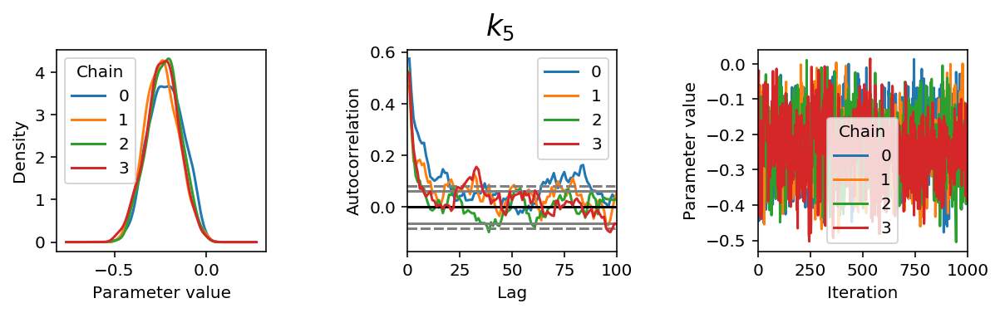

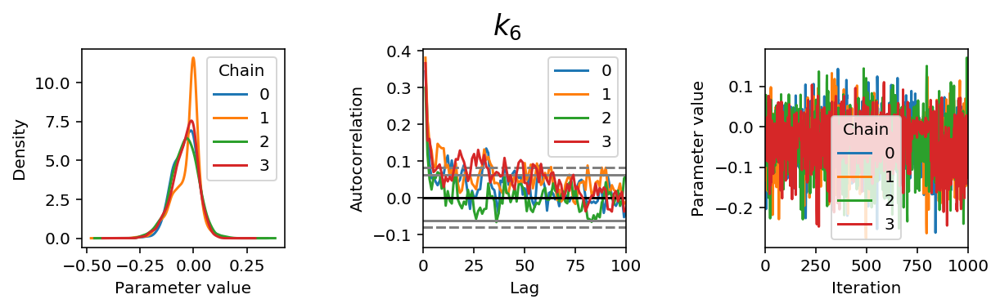

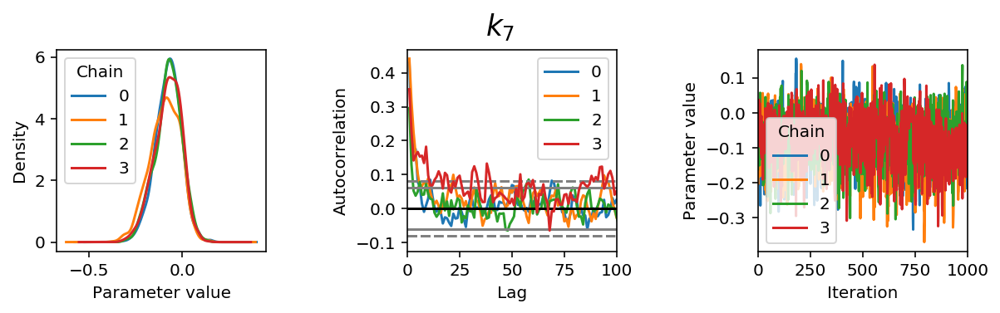

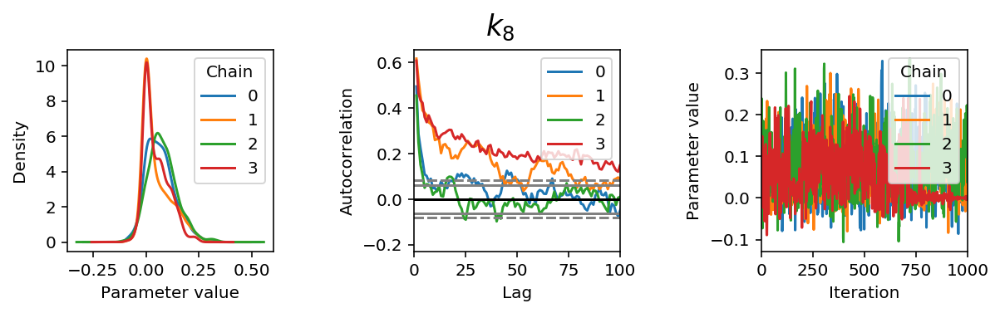

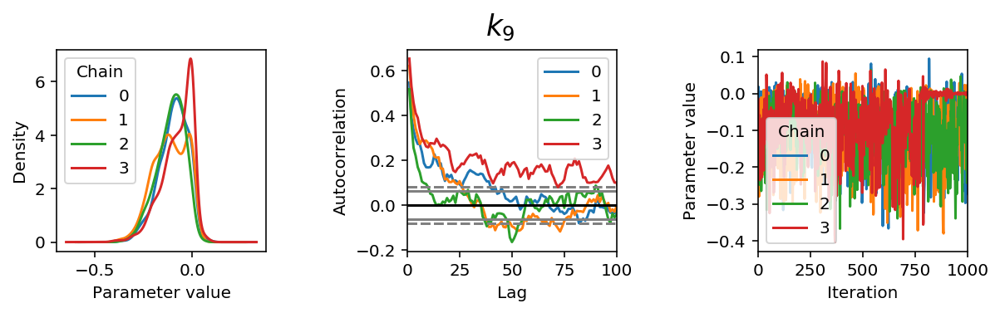

In [33]:
## Use pandas three dimensional Panel to represent the trace:

trace = pd.Panel({k: v for k, v in samples_Nm2.items()})
trace.axes[0].name = 'Variable'
trace.axes[1].name = 'Iteration'
trace.axes[2].name = 'Chain'
 
## Point estimates:
print(trace.to_frame().mean())
 
## Bayesian equal-tailed 95% credible intervals:
print(trace.to_frame().quantile([0.05, 0.95]))
  ## ^ entering the values here could be a good question part
    
def plot(trace, var):
    fig, axes = plt.subplots(1, 3, figsize=(9, 3))
    fig.suptitle(var, y=0.95, fontsize='xx-large')
 
    ## Marginal posterior density estimate:
    trace[var].plot.density(ax=axes[0])
    axes[0].set_xlabel('Parameter value')
    axes[0].locator_params(tight=True)
 
    ## Autocorrelation for each chain:
    axes[1].set_xlim(0, 100)
    for chain in trace[var].columns:
        autocorrelation_plot(trace[var,:,chain], axes[1], label=chain)
 
    ## Trace plot:
    axes[2].set_ylabel('Parameter value')
    trace[var].plot(ax=axes[2])
 
    ## Save figure
    filename = var.replace("\\", "") 
    filename = filename.replace("/", "") 
    filename = filename.replace("$", "") 
    filename = filename.replace("}", "") 
    filename = filename.replace("{", "") 
    plt.tight_layout(pad=3)
    fig.savefig('Nm2_JAGS_'+'{}.png'.format(filename))

    
## Display diagnostic plots
for var in trace:
    plot(trace, var)
 


In [34]:
## Scatter matrix plot:

## Redefine the trace so that we only vizualize every 10th latent variable element in 
## the scatter_matrix plot below. Vizualizing all 50 is too cumbersome for the scatter
## matrix. 

samples_Nm2_for_scatter_matrix = {}

## adjust the thin varible to only look at every 10th population element by setting it to 10
thin = 10
numHyperParams = 4
dim = (Ndata/thin)*2 + numHyperParams
print(dim)

for i in np.arange(0,Ndata,thin):
    samples_Nm2_for_scatter_matrix.update({'$h_{'+str(i+1)+'}$': samples2['h'][i,start::,:], '$k_{'+str(i+1)+'}$': samples2['k'][i,start::,:]})
samples_Nm2_for_scatter_matrix.update({'$e_{\sigma_{low}}$': esigma_low, '$e_{\sigma_{high}}$': esigma_hi })
samples_Nm2_for_scatter_matrix.update({'$f_{low}$': f_low,'$f_{high}$': f_hi })

for j, i in samples_Nm2_for_scatter_matrix.items():
    print(j)
#    print(i)

trace_3 = pd.Panel({k: v for k, v in samples_Nm2_for_scatter_matrix.items()})

sm = scatter_matrix(trace_3.to_frame(),  color="darkturquoise", alpha=0.2, figsize=(dim*2, dim*2), diagonal='hist',hist_kwds={'bins':25,'histtype':'step', 'edgecolor':'r','linewidth':2})
## y labels size
[plt.setp(item.yaxis.get_label(), 'size', 20) for item in sm.ravel()]
## x labels size 
[plt.setp(item.xaxis.get_label(), 'size', 20) for item in sm.ravel()]
## Change label rotation
## This is helpful for very long labels
#[s.xaxis.label.set_rotation(45) for s in sm.reshape(-1)]
[s.xaxis.label.set_rotation(0) for s in sm.reshape(-1)]
[s.yaxis.label.set_rotation(0) for s in sm.reshape(-1)]
## May need to offset label when rotating to prevent overlap of figure
[s.get_yaxis().set_label_coords(-0.5,0.5) for s in sm.reshape(-1)]
## Hide all ticks
#[s.set_xticks(()) for s in sm.reshape(-1)]
#[s.set_yticks(()) for s in sm.reshape(-1)]

plt.savefig('scatter_matrix_Nm2_JAGS.png')


9.0
$k_{21}$
$h_{21}$
$e_{\sigma_{low}}$
$k_{1}$
$f_{high}$
$k_{11}$
$f_{low}$
$h_{1}$
$e_{\sigma_{high}}$
$h_{11}$


/anaconda/envs/dsfp_py27/lib/python2.7/site-packages/ipykernel_launcher.py:26: FutureWarning: 'pandas.tools.plotting.scatter_matrix' is deprecated, import 'pandas.plotting.scatter_matrix' instead.
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.
